In [ ]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from statsmodels.stats.diagnostic import normal_ad
from sklearn.preprocessing import MinMaxScaler
from sklearn import linear_model
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
tabela = pd.read_csv('/content/drive/MyDrive/Covid Data.csv')

tabela['CLASIFFICATION_FINAL'] = tabela['CLASIFFICATION_FINAL'].replace({1: 1, 2: 1, 3: 1, 7: 0, 5: 0, 6: 0, 4: 0})
colunas  = ['DIABETES','SEX','PATIENT_TYPE','PNEUMONIA','ASTHMA','INMSUPR','HIPERTENSION','OTHER_DISEASE','CARDIOVASCULAR','OBESITY','RENAL_CHRONIC','TOBACCO' ]

for col in colunas :
  tabela[col] = tabela[col].replace({1: 0, 2: 1})

In [ ]:
tabela.shape

(1048575, 21)

In [ ]:
tabela.head()

,USMER,MEDICAL_UNIT,SEX,PATIENT_TYPE,DATE_DIED,INTUBED,PNEUMONIA,AGE,PREGNANT,DIABETES,...,ASTHMA,INMSUPR,HIPERTENSION,OTHER_DISEASE,CARDIOVASCULAR,OBESITY,RENAL_CHRONIC,TOBACCO,CLASIFFICATION_FINAL,ICU
0,2,1,0,0,03/05/2020,97,0,65,2,1,...,1,1,0,1,1,1,1,1,1,97
1,2,1,1,0,03/06/2020,97,0,72,97,1,...,1,1,0,1,1,0,0,1,0,97
2,2,1,1,1,09/06/2020,1,1,55,97,0,...,1,1,1,1,1,1,1,1,1,2
3,2,1,0,0,12/06/2020,97,1,53,2,1,...,1,1,1,1,1,1,1,1,0,97
4,2,1,1,0,21/06/2020,97,1,68,97,0,...,1,1,0,1,1,1,1,1,1,97


In [ ]:
tabela.describe()

,USMER,MEDICAL_UNIT,SEX,PATIENT_TYPE,INTUBED,PNEUMONIA,AGE,PREGNANT,DIABETES,COPD,ASTHMA,INMSUPR,HIPERTENSION,OTHER_DISEASE,CARDIOVASCULAR,OBESITY,RENAL_CHRONIC,TOBACCO,CLASIFFICATION_FINAL,ICU
count,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06
mean,1.632194e+00,8.980565e+00,4.992595e-01,1.907646e-01,7.952288e+01,2.362092e+00,4.179410e+01,4.976558e+01,1.189588e+00,2.260569e+00,1.245467e+00,1.301379e+00,1.131950e+00,1.439954e+00,1.264743e+00,1.128067e+00,1.260046e+00,1.217404e+00,3.738207e-01,7.955397e+01
std,4.822084e-01,3.723278e+00,4.999997e-01,3.929041e-01,3.686889e+01,1.203542e+01,1.690739e+01,4.751073e+01,5.480474e+00,5.132258e+00,5.167285e+00,5.519715e+00,5.290596e+00,6.715852e+00,5.248913e+00,5.229012e+00,5.188801e+00,5.378356e+00,4.838171e-01,3.682307e+01
min,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
25%,1.000000e+00,4.000000e+00,0.000000e+00,0.000000e+00,9.700000e+01,1.000000e+00,3.000000e+01,2.000000e+00,1.000000e+00,2.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,9.700000e+01
50%,2.000000e+00,1.200000e+01,0.000000e+00,0.000000e+00,9.700000e+01,1.000000e+00,4.000000e+01,9.700000e+01,1.000000e+00,2.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,9.700000e+01
75%,2.000000e+00,1.200000e+01,1.000000e+00,0.000000e+00,9.700000e+01,1.000000e+00,5.300000e+01,9.700000e+01,1.000000e+00,2.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,9.700000e+01
max,2.000000e+00,1.300000e+01,1.000000e+00,1.000000e+00,9.900000e+01,9.900000e+01,1.210000e+02,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01,1.000000e+00,9.900000e+01


In [ ]:
tabela.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 21 columns):
 #   Column                Non-Null Count    Dtype 
---  ------                --------------    ----- 
 0   USMER                 1048575 non-null  int64 
 1   MEDICAL_UNIT          1048575 non-null  int64 
 2   SEX                   1048575 non-null  int64 
 3   PATIENT_TYPE          1048575 non-null  int64 
 4   DATE_DIED             1048575 non-null  object
 5   INTUBED               1048575 non-null  int64 
 6   PNEUMONIA             1048575 non-null  int64 
 7   AGE                   1048575 non-null  int64 
 8   PREGNANT              1048575 non-null  int64 
 9   DIABETES              1048575 non-null  int64 
 10  COPD                  1048575 non-null  int64 
 11  ASTHMA                1048575 non-null  int64 
 12  INMSUPR               1048575 non-null  int64 
 13  HIPERTENSION          1048575 non-null  int64 
 14  OTHER_DISEASE         1048575 non-null  int64 
 15

sex: 1 para feminino e 2 para masculino.


age: idade do paciente.

classification: resultados de testes ambiciosos. Valores de 1 a 3 significam que o paciente foi diagnosticado com covid em diferentes graus. 4 ou superior significa que o paciente não é portador de covid ou que o teste é inconclusivo.

patient type:  tipo de atendimento que o paciente recebeu na unidade. 1 para regresso a casa e 2 para internamento.


pneumonia: se o paciente já tem inflamação dos sacos aéreos ou não.

pregnancy: se a paciente está grávida ou não.

diabetes: se o paciente tem diabetes ou não.

copd: Indica se o paciente tem doença pulmonar obstrutiva crônica ou não.

asthma:  se o paciente tem asma ou não

inmsupr: se o paciente é imunossuprimido ou não.

hypertension: se o paciente tem hipertensão ou não.

cardiovascular: se o paciente tem doença relacionada ao coração ou aos vasos sanguíneos.

renal chronic: se o paciente tem doença renal crônica ou não.

other disease: se o paciente tem outra doença ou não.

obesity: se o paciente é obeso ou não.

tobacco: se o paciente é tabagista.

usmr: Indica se o paciente tratou unidades médicas de primeiro, segundo ou terceiro nível.

medical unit: tipo de instituição do Sistema Único de Saúde que prestou o atendimento.

intubed: se o paciente estava conectado ao ventilador.

icu:  Indica se o paciente foi internado em uma Unidade de Terapia Intensiva.

date died: Se o paciente faleceu indicar a data do falecimento, caso contrário 9999-99-99.

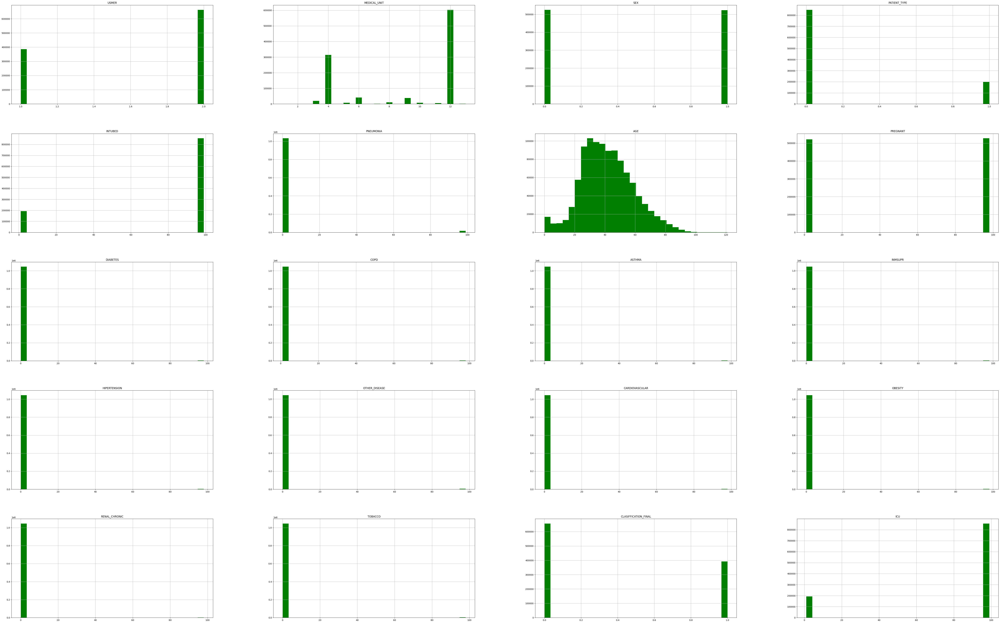

In [ ]:
tabela.hist(bins=30, figsize=(80,50),color='green');plt.show()


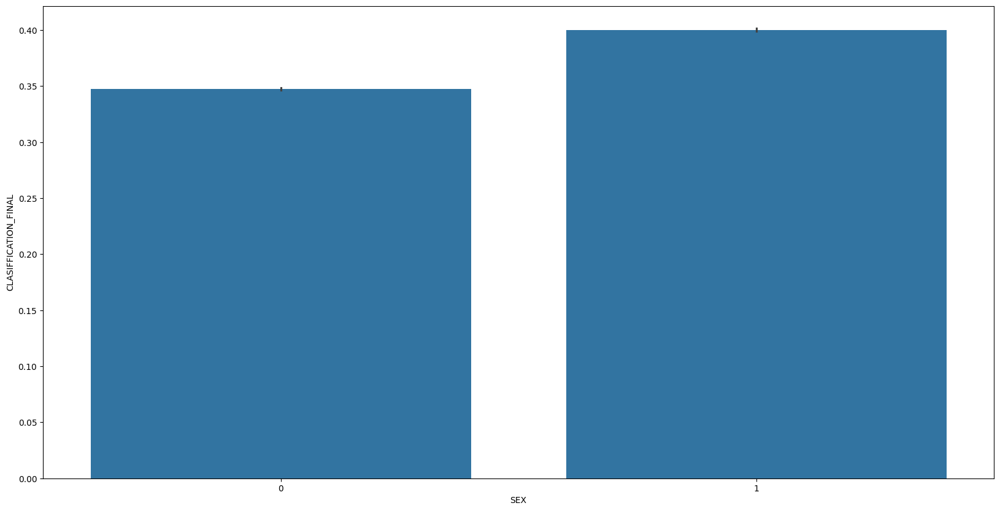

In [ ]:
plt.figure(figsize = (20,10))
sns.barplot(x = 'SEX', y = 'CLASIFFICATION_FINAL', data=tabela)
plt.show()

In [ ]:
Intubed_corte='97'
lixo = tabela[tabela['INTUBED'] == Intubed_corte]
tabela_limpa = tabela[tabela['INTUBED'] != Intubed_corte]
tabela_limpa


,USMER,MEDICAL_UNIT,SEX,PATIENT_TYPE,DATE_DIED,INTUBED,PNEUMONIA,AGE,PREGNANT,DIABETES,...,ASTHMA,INMSUPR,HIPERTENSION,OTHER_DISEASE,CARDIOVASCULAR,OBESITY,RENAL_CHRONIC,TOBACCO,CLASIFFICATION_FINAL,ICU
0,2,1,0,0,03/05/2020,97,0,65,2,1,...,1,1,0,1,1,1,1,1,1,97
1,2,1,1,0,03/06/2020,97,0,72,97,1,...,1,1,0,1,1,0,0,1,0,97
2,2,1,1,1,09/06/2020,1,1,55,97,0,...,1,1,1,1,1,1,1,1,1,2
3,2,1,0,0,12/06/2020,97,1,53,2,1,...,1,1,1,1,1,1,1,1,0,97
4,2,1,1,0,21/06/2020,97,1,68,97,0,...,1,1,0,1,1,1,1,1,1,97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048570,2,13,1,0,9999-99-99,97,1,40,97,1,...,1,1,1,1,1,1,1,1,0,97
1048571,1,13,1,1,9999-99-99,2,1,51,97,1,...,1,1,0,1,1,1,1,1,0,2
1048572,2,13,1,0,9999-99-99,97,1,55,97,1,...,1,1,1,1,1,1,1,1,0,97
1048573,2,13,1,0,9999-99-99,97,1,28,97,1,...,1,1,1,1,1,1,1,1,0,97


In [ ]:
Intubed_corte=97
Intubed_corte2=99
lixo = tabela[tabela['INTUBED'] == Intubed_corte]
tabela_limpa = tabela[tabela['INTUBED'] != Intubed_corte]

lixo2 = tabela_limpa[tabela_limpa['INTUBED'] == Intubed_corte2]
tabela_limpa2 = tabela_limpa[tabela_limpa['INTUBED'] != Intubed_corte2]
tabela_limpa2

,USMER,MEDICAL_UNIT,SEX,PATIENT_TYPE,DATE_DIED,INTUBED,PNEUMONIA,AGE,PREGNANT,DIABETES,...,ASTHMA,INMSUPR,HIPERTENSION,OTHER_DISEASE,CARDIOVASCULAR,OBESITY,RENAL_CHRONIC,TOBACCO,CLASIFFICATION_FINAL,ICU
2,2,1,1,1,09/06/2020,1,1,55,97,0,...,1,1,1,1,1,1,1,1,1,2
5,2,1,0,1,9999-99-99,2,0,40,2,1,...,1,1,1,1,1,1,1,1,1,2
8,2,1,0,1,9999-99-99,2,1,37,2,0,...,1,1,0,1,1,0,1,1,1,2
9,2,1,0,1,9999-99-99,2,1,25,2,1,...,1,1,1,1,1,1,1,1,1,2
11,2,1,1,1,9999-99-99,2,1,24,97,1,...,1,1,1,1,1,1,1,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048553,2,13,0,1,9999-99-99,2,0,61,2,0,...,1,1,0,1,1,1,1,1,0,2
1048554,2,13,0,1,9999-99-99,2,0,63,2,1,...,0,1,1,1,1,0,1,1,0,2
1048567,1,13,0,1,9999-99-99,2,1,23,2,0,...,1,1,1,1,1,0,1,1,0,2
1048569,1,13,0,1,9999-99-99,2,1,56,2,0,...,1,1,1,1,1,1,1,1,0,2


In [ ]:
data_corte='9999-99-99'
vivo = tabela_limpa2[tabela_limpa2['DATE_DIED'] == data_corte]
morto = tabela_limpa2[tabela_limpa2['DATE_DIED'] != data_corte]

In [ ]:
vivo

,USMER,MEDICAL_UNIT,SEX,PATIENT_TYPE,DATE_DIED,INTUBED,PNEUMONIA,AGE,PREGNANT,DIABETES,...,ASTHMA,INMSUPR,HIPERTENSION,OTHER_DISEASE,CARDIOVASCULAR,OBESITY,RENAL_CHRONIC,TOBACCO,CLASIFFICATION_FINAL,ICU
5,2,1,0,1,9999-99-99,2,0,40,2,1,...,1,1,1,1,1,1,1,1,1,2
8,2,1,0,1,9999-99-99,2,1,37,2,0,...,1,1,0,1,1,0,1,1,1,2
9,2,1,0,1,9999-99-99,2,1,25,2,1,...,1,1,1,1,1,1,1,1,1,2
11,2,1,1,1,9999-99-99,2,1,24,97,1,...,1,1,1,1,1,1,1,1,1,2
12,2,1,1,1,9999-99-99,2,1,30,97,1,...,1,1,1,1,1,1,1,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048553,2,13,0,1,9999-99-99,2,0,61,2,0,...,1,1,0,1,1,1,1,1,0,2
1048554,2,13,0,1,9999-99-99,2,0,63,2,1,...,0,1,1,1,1,0,1,1,0,2
1048567,1,13,0,1,9999-99-99,2,1,23,2,0,...,1,1,1,1,1,0,1,1,0,2
1048569,1,13,0,1,9999-99-99,2,1,56,2,0,...,1,1,1,1,1,1,1,1,0,2


In [ ]:
morto

,USMER,MEDICAL_UNIT,SEX,PATIENT_TYPE,DATE_DIED,INTUBED,PNEUMONIA,AGE,PREGNANT,DIABETES,...,ASTHMA,INMSUPR,HIPERTENSION,OTHER_DISEASE,CARDIOVASCULAR,OBESITY,RENAL_CHRONIC,TOBACCO,CLASIFFICATION_FINAL,ICU
2,2,1,1,1,09/06/2020,1,1,55,97,0,...,1,1,1,1,1,1,1,1,1,2
152,1,2,1,1,05/04/2020,1,0,14,97,1,...,1,1,1,1,1,1,1,1,0,2
153,1,2,0,1,08/05/2020,1,1,0,2,1,...,1,1,1,1,1,1,1,1,0,2
154,1,2,1,1,20/05/2020,1,0,17,97,1,...,1,1,1,1,1,1,1,1,0,2
325,1,3,1,1,18/02/2020,2,1,43,97,0,...,1,1,0,1,1,1,0,1,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1047633,1,13,1,1,12/07/2020,2,0,57,97,0,...,1,1,0,1,1,0,1,0,1,2
1047634,1,13,0,1,15/07/2020,2,1,79,2,1,...,1,1,0,1,1,1,1,1,1,2
1047635,1,13,1,1,18/07/2020,1,0,73,97,1,...,1,1,0,1,1,0,1,1,1,2
1047638,1,13,1,1,29/07/2020,1,0,80,97,1,...,1,1,1,1,1,0,1,1,1,2


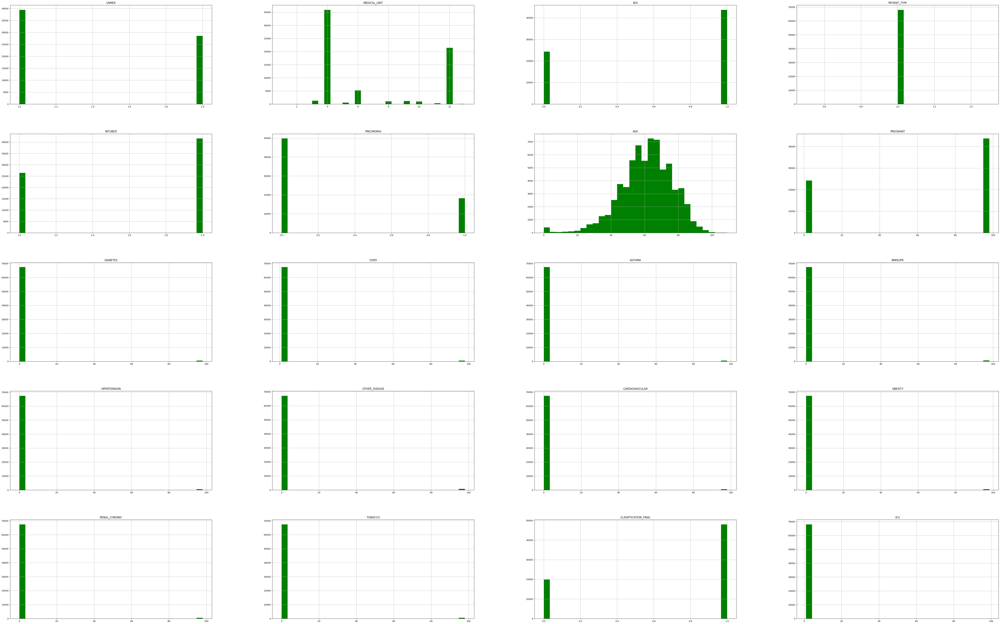

In [ ]:
morto.hist(bins=30, figsize=(80,50),color='green');plt.show()

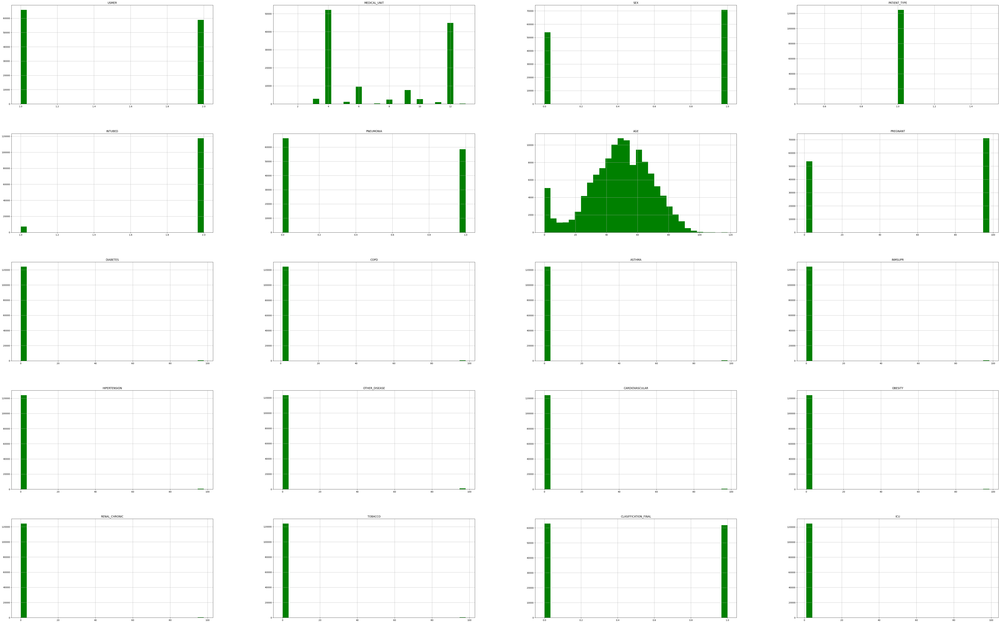

In [ ]:
vivo.hist(bins=30, figsize=(80,50),color='green');plt.show()

##parte 2


In [ ]:
#colunas selecionadas para normalização

cols = ['DIABETES','COPD','ASTHMA','INMSUPR','HIPERTENSION','OTHER_DISEASE','OBESITY','RENAL_CHRONIC','TOBACCO']
scaler = MinMaxScaler(feature_range=(-1, 1))

# Ajustando a tabela
tabela[cols] = scaler.fit_transform(tabela[cols])

tabela[tabela.isnull().any(axis=1)]

tabela = tabela.dropna() #sem linhas nulas

<Axes: >

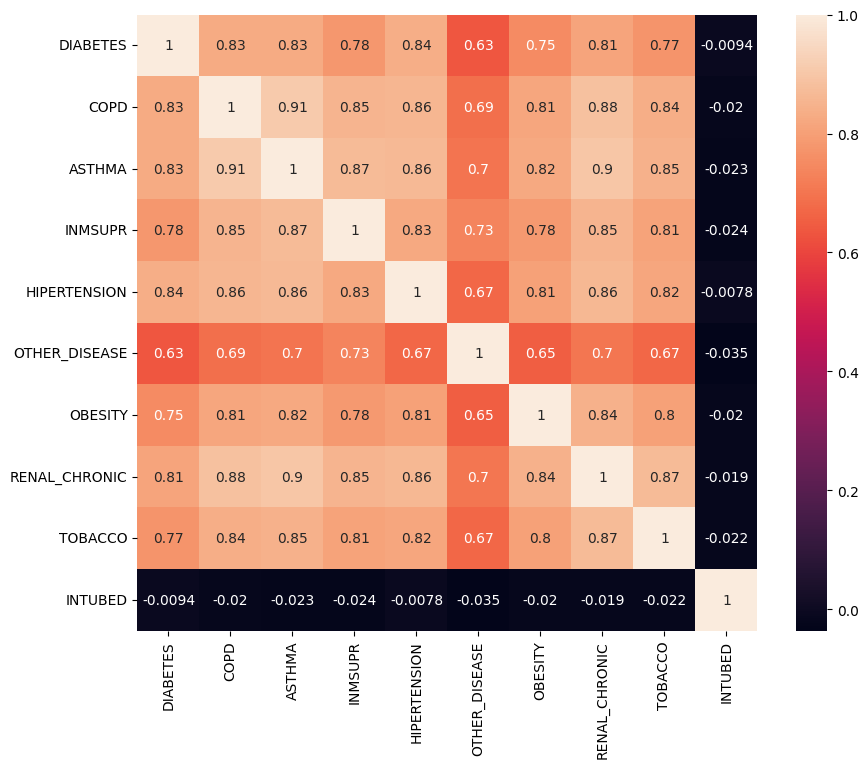

In [ ]:
correlacao = tabela[['DIABETES','COPD','ASTHMA','INMSUPR','HIPERTENSION','OTHER_DISEASE','OBESITY','RENAL_CHRONIC','TOBACCO','INTUBED']]
plt.figure(figsize=(10,8))


correlacao.describe()
sns.heatmap(correlacao.corr(), annot = True)


<Axes: >

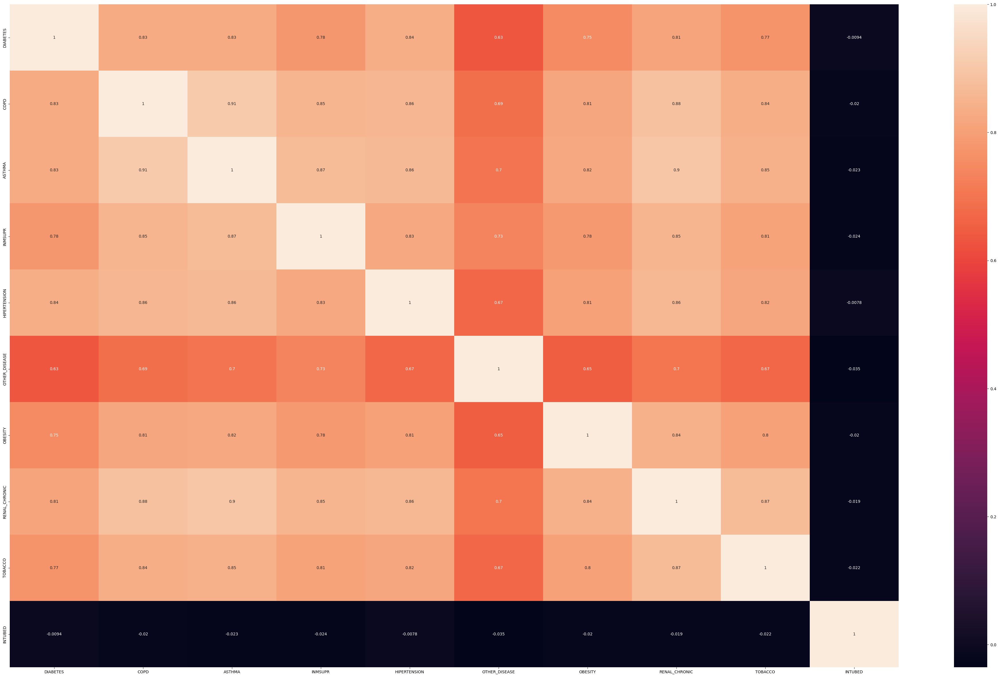

In [ ]:
correlacao2 = vivo
plt.figure(figsize=(50,30))


correlacao2.describe()
sns.heatmap(correlacao.corr(), annot = True)

<Axes: >

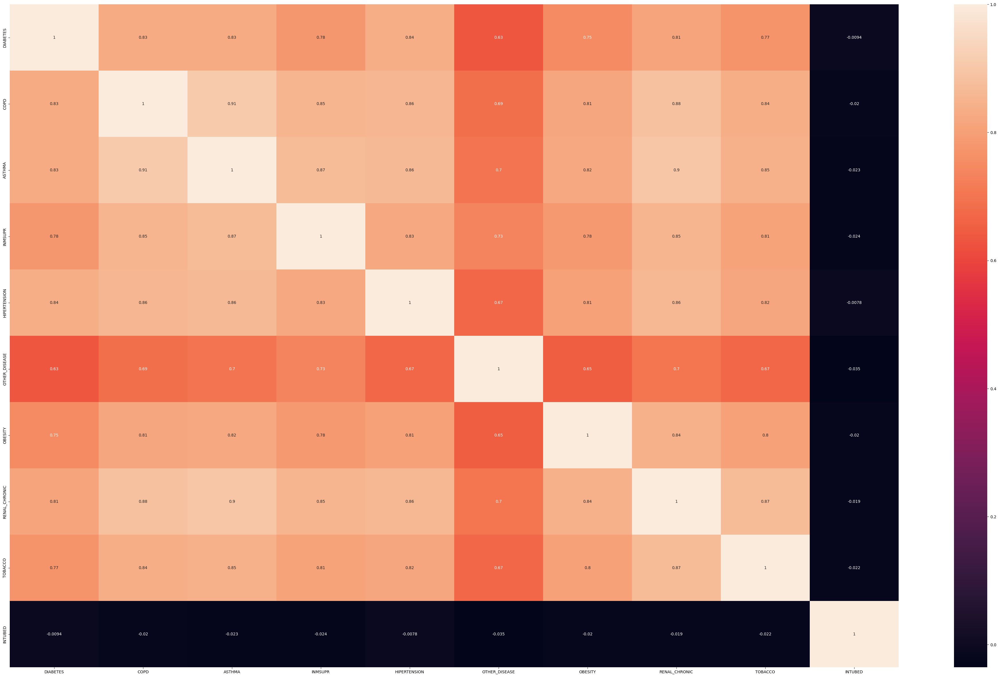

In [ ]:
correlacao1 = morto
plt.figure(figsize=(50,30))


correlacao1.describe()
sns.heatmap(correlacao.corr(), annot = True)

In [ ]:
x = vivo[['INTUBED']].head(67982)
y = morto[['INTUBED']]
print(x.shape, y.shape)

from sklearn.neighbors import KNeighborsClassifier
#knn com 5 vizinhos
classifier = KNeighborsClassifier(n_neighbors = 5)
#treina o modelo
classifier.fit(x, y)

(67982, 1) (67982, 1)


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier()

In [ ]:
##igualando quantidade de dados variaveis

len_x = len(x)
len_y = len(y)

if len_x > len_y:
    # Amostrar aleatoriamente os dados de x para igualar o tamanho de y
    x = x.sample(n=len_y, random_state=42)
elif len_y > len_x:
    # Amostrar aleatoriamente os dados de y para igualar o tamanho de x
    y = y.sample(n=len_x, random_state=42)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
#knn com 5 vizinhos
classifier = KNeighborsClassifier(n_neighbors = 5)
#treina o modelo
classifier.fit(x, y)

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier()

In [ ]:
#predição dos valores
y_pred = classifier.predict(x)
print(y_pred[:4])

[1 1 1 1]


In [ ]:
#avaliar o desempenho: acurária = total de acertos/total
acuracia =  classifier.score(x, y)
print(acuracia)

0.398840869641964


In [ ]:
##vamos dividir os dados em conjunto de treinamento e teste
from sklearn.model_selection import train_test_split
#75% treinamento 25% para teste
x_treinamento, x_teste, y_treinamento, y_teste = train_test_split(x, y, test_size=0.50, random_state=10)

In [ ]:
#modelo 1
classifier1 = KNeighborsClassifier(n_neighbors = 5)
#treina o modelo
classifier1.fit(x_treinamento, y_treinamento)
#predição dos valores
y_pred = classifier1.predict(x_teste)
#avaliar o desempenho: acurária = total de acertos/total
pontos =  classifier1.score(x_teste, y_teste)
print(pontos)

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


0.6108675825953929


In [ ]:
#knn com dois vizinhos
#modelo 2
classifier2 = KNeighborsClassifier(n_neighbors = 3)
#treina o modelo
classifier2.fit(x_treinamento, y_treinamento)
#predição dos valores
y_pred = classifier2.predict(x_teste)
#avaliar o desempenho: acurária = total de acertos/total
pontos =  classifier2.score(x_teste, y_teste)
print(pontos)

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


0.6108675825953929


In [ ]:
from sklearn.metrics import r2_score
r2_score(y_teste, y_pred)
#os pressupostos não foram avaliados

-0.6370159892120986

In [ ]:
from sklearn.metrics import confusion_matrix

# supondo que você tenha previsto valores e os valores reais, armazenados em duas variáveis separadas

# criar matriz de confusão
#tabela.price_range.shape.shape
conf_matrix = confusion_matrix(x_teste,y_pred)

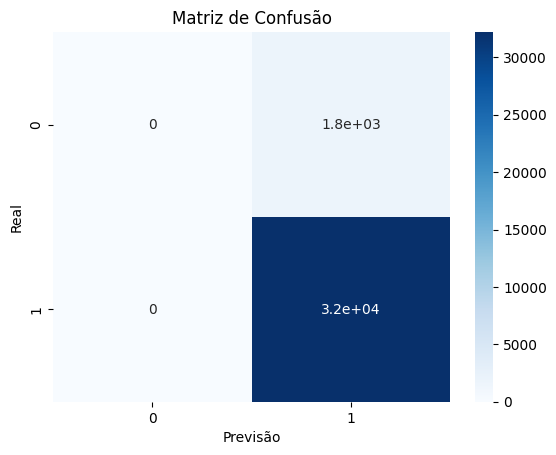

In [ ]:
import seaborn as sns
sns.heatmap(conf_matrix, annot=True, cmap='Blues')
plt.title('Matriz de Confusão')
plt.xlabel('Previsão')
plt.ylabel('Real')
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_teste,y_pred)
print(accuracy)

0.6108675825953929


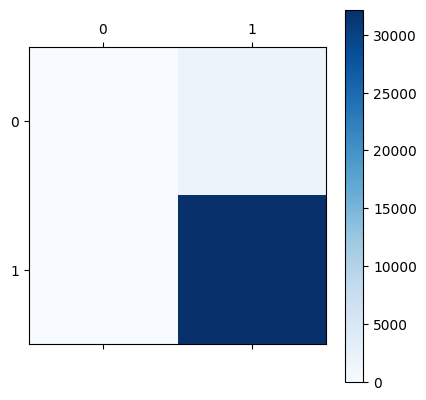

In [ ]:
import matplotlib.pyplot as plt
plt.matshow(conf_matrix, cmap=plt.cm.Blues)
plt.colorbar()

In [ ]:
from sklearn.metrics import classification_report

report = classification_report(x_teste,y_pred)


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import precision_score
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import confusion_matrix
precision = precision_score(x_teste,y_pred, average='macro')


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
f1 = f1_score(x_teste, y_pred,average='macro')
recall = recall_score(x_teste, y_pred, average='macro')


In [ ]:
print("Matriz de Confusão:\n", conf_matrix)
print("\nPrecisão:", precision)
print("\nAcurácia:", accuracy)
print("\nF1-score:", f1)
print("\nRecall:", recall)
print("\n\n")
print("Report:", report)


Matriz de Confusão:
 [[    0  1798]
 [    0 32193]]

Precisão: 0.47355182254126094

Acurácia: 0.6108675825953929

F1-score: 0.48641665659373867

Recall: 0.5



Report:               precision    recall  f1-score   support

           1       0.00      0.00      0.00      1798
           2       0.95      1.00      0.97     32193

    accuracy                           0.95     33991
   macro avg       0.47      0.50      0.49     33991
weighted avg       0.90      0.95      0.92     33991



In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

In [ ]:
selector = SelectKBest(k='all')  # Vamos selecionar os 5 melhores atributos
x_selected = selector.fit_transform(x_scaled, y)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
model = LogisticRegression()
model.fit(x_selected, y)


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression()

In [ ]:
scores = cross_val_score(model, x_selected, y, cv=5)  # cv=5 indica 5 folds na validação cruzada

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

In [ ]:
y_pred2 = model.predict(x_selected)

# Impressão do resultado
print("Resultado da predição:")
print(y_pred)

Resultado da predição:
[2 2 2 ... 2 2 2]


In [ ]:
print("\nResultados da validação cruzada:");
print(scores);
print("\nAcurácia média: ", scores.mean());


Resultados da validação cruzada:
[0.61189968 0.61197323 0.61194469 0.61194469 0.61194469]

Acurácia média:  0.6119413963972764


PARTE 3


In [ ]:
vivo['ICU']

,ICU
5,2
8,2
9,2
11,2
12,2
16,1
20,1
30,2
41,1
53,2


# ***Etapa 3***

<Axes: >

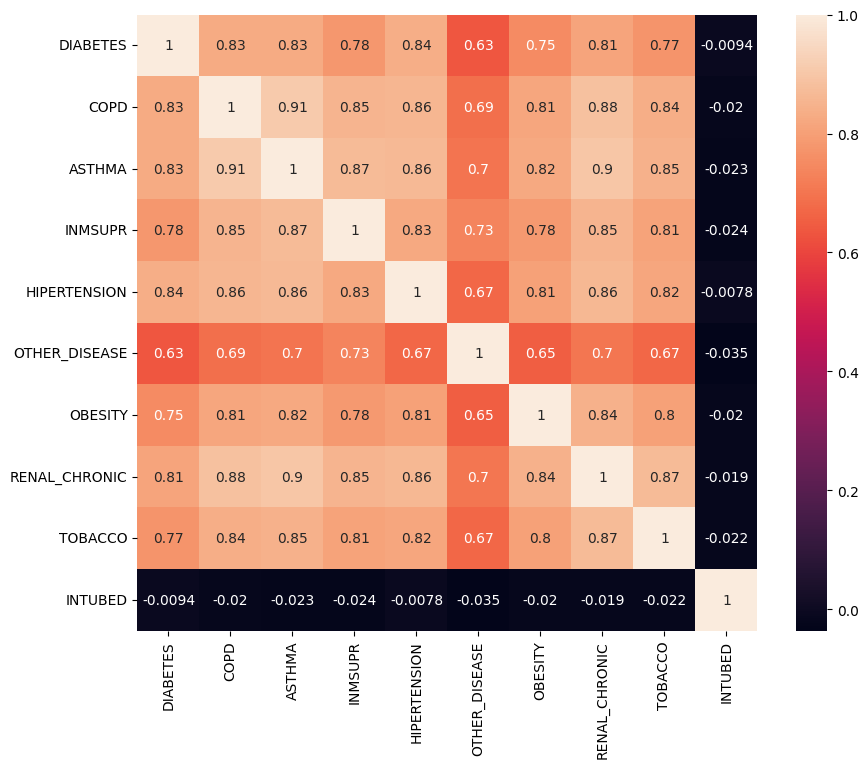

In [ ]:
correlacao = tabela[['DIABETES','COPD','ASTHMA','INMSUPR','HIPERTENSION','OTHER_DISEASE','OBESITY','RENAL_CHRONIC','TOBACCO','INTUBED']]
plt.figure(figsize=(10,8))


correlacao.describe()
sns.heatmap(correlacao.corr(), annot = True)

In [ ]:
from sklearn.feature_selection import SequentialFeatureSelector


# Separa as características e o rótulo
x = tabela[['DIABETES','COPD','ASTHMA','INMSUPR','HIPERTENSION','OTHER_DISEASE','OBESITY','RENAL_CHRONIC','TOBACCO','INTUBED']]
y = tabela[['INTUBED']]

nomes_colunas = ['DIABETES','COPD','ASTHMA','INMSUPR','HIPERTENSION','OTHER_DISEASE','OBESITY','RENAL_CHRONIC','TOBACCO','INTUBED']


# Divide o conjunto de dados em treino e teste
x_treinamento, x_test, y_treinamento, y_test = train_test_split(x, y, test_size=0.2, random_state=42, stratify=y)

# Cria um objeto KNN com k=3
knn = KNeighborsClassifier(n_neighbors=7)

# Cria uma lista para armazenar as acurácias obtidas para cada valor de k
scores = []

# Loop para ajustar o modelo e calcular a acurácia para cada valor de k
for k in range(1, 20):


    # Cria um objeto Sequential Feature Selector para selecionar as k melhores características
    sfs = SequentialFeatureSelector(knn, n_features_to_select=k)

    # Aplica o Sequential Feature Selector ao conjunto de dados de treino
    X_train_sfs = sfs.fit_transform(x_treinamento, y_treinamento)

    # Aplica o Sequential Feature Selector ao conjunto de dados de teste
    X_test_sfs = sfs.transform(x_test)

    # Treina o modelo KNN com as características selecionadas
    knn.fit(X_train_sfs, y_treinamento)

    # Obtém os índices das características selecionadas
    selected_features_idx = sfs.get_support(indices=True)


    # Obtém os nomes das características selecionadas
    selected_features_names = [nomes_colunas[i] for i in selected_features_idx]

    # Calcula a acurácia do modelo no conjunto de teste
    score = knn.score(X_test_sfs, y_test)

   # Imprime as características selecionadas
    selected_features = [nomes_colunas[i] for i in selected_features_idx]
    print("Características selecionadas com as {} melhores características:".format(k))
    print(selected_features)
    print("Acurácia com as características selecionadas: {:.2f}%".format(score*100))

# Imprime as acurácias obtidas para cada valor de k
for k, score in enumerate(scores, start=1):
    print("Acurácia com as {} melhores características: {:.2f}%".format(k, score*100))

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

FILTER


In [ ]:
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.preprocessing import MinMaxScaler

# Separa as características e o rótulo
X = x = tabela[['DIABETES','COPD','ASTHMA','INMSUPR','HIPERTENSION','OTHER_DISEASE','OBESITY','RENAL_CHRONIC','TOBACCO','INTUBED']]

y = tabela[['INTUBED']]

nomes_colunas = ['DIABETES','COPD','ASTHMA','INMSUPR','HIPERTENSION','OTHER_DISEASE','OBESITY','RENAL_CHRONIC','TOBACCO','INTUBED']

scaler = MinMaxScaler()
x = scaler.fit_transform(X)

# Divide o conjunto de dados em treino e teste
x_treinamento, x_test, y_treinamento, y_test = train_test_split(x, y, test_size=0.2, random_state=42,stratify=y)

best_accuracy = 0
best_k = 0

for k in range(1, 20):
    # Realiza a seleção de características usando SelectKBest e chi2
    selector = SelectKBest(chi2, k=k)
    X_train_new = selector.fit_transform(X_train, y_train)
    X_test_new = selector.transform(X_test)

    # Cria um modelo KNN com k=7 e treina com as características selecionadas
    knn = KNeighborsClassifier(n_neighbors=7)
    knn.fit(X_train_new, y_train)

    # Faz as previsões no conjunto de teste e calcula a acurácia
    y_pred = knn.predict(X_test_new)
    accuracy = accuracy_score(y_test, y_pred)

    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_k = k

    # Obtém os índices das características selecionadas
    selected_features_idx = selector.get_support(indices=True)


    # Obtém os nomes das características selecionadas
    selected_features_names = [nomes_colunas[i] for i in selected_features_idx]

    # Obtém os valores de chi2 de todas as características
    chi2_scores = selector.scores_

    # Obtém os valores de chi2 das características selecionadas
    selected_chi2_scores = chi2_scores[selected_features_idx]

    # Imprime as características selecionadas e seus valores de chi2
    print("Características selecionadas para k = {}: {}".format(k, selected_features_names))
    print("Acurácia com as características selecionadas: {:.2f}%".format(accuracy*100))



# Imprime a acurácia e o melhor valor de k encontrado
print("Melhor valor de k: {}".format(best_k))
print("Acurácia com as características selecionadas: {:.2f}%".format(best_accuracy*100))
